%%%%%%%%%%%%%%%%%%%%%%%%%% SONG RECOMMENDAION SYSTEM %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

In [1]:
import numpy as np
import pandas as pd
import os
import json
from zipfile import ZipFile
import re
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import matplotlib.pyplot as plt
import difflib

In [2]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity


In [3]:
df = pd.read_csv("spotify_millsongdata.csv.zip")

In [4]:
df

,artist,song,link,text
0,ABBA,Ahe's My Kind Of Girl,/a/abba/ahes+my+kind+of+girl_20598417.html,"Look at her face, it's a wonderful face \r\nA..."
1,ABBA,"Andante, Andante",/a/abba/andante+andante_20002708.html,"Take it easy with me, please \r\nTouch me gen..."
2,ABBA,As Good As New,/a/abba/as+good+as+new_20003033.html,I'll never know why I had to go \r\nWhy I had...
3,ABBA,Bang,/a/abba/bang_20598415.html,Making somebody happy is a question of give an...
4,ABBA,Bang-A-Boomerang,/a/abba/bang+a+boomerang_20002668.html,Making somebody happy is a question of give an...
...,...,...,...,...
57645,Ziggy Marley,Good Old Days,/z/ziggy+marley/good+old+days_10198588.html,Irie days come on play \r\nLet the angels fly...
57646,Ziggy Marley,Hand To Mouth,/z/ziggy+marley/hand+to+mouth_20531167.html,Power to the workers \r\nMore power \r\nPowe...
57647,Zwan,Come With Me,/z/zwan/come+with+me_20148981.html,all you need \r\nis something i'll believe \...
57648,Zwan,Desire,/z/zwan/desire_20148986.html,northern star \r\nam i frightened \r\nwhere ...


In [5]:
df = df.drop("link",axis=1).reset_index(drop = True)

In [6]:
df

,artist,song,text
0,ABBA,Ahe's My Kind Of Girl,"Look at her face, it's a wonderful face \r\nA..."
1,ABBA,"Andante, Andante","Take it easy with me, please \r\nTouch me gen..."
2,ABBA,As Good As New,I'll never know why I had to go \r\nWhy I had...
3,ABBA,Bang,Making somebody happy is a question of give an...
4,ABBA,Bang-A-Boomerang,Making somebody happy is a question of give an...
...,...,...,...
57645,Ziggy Marley,Good Old Days,Irie days come on play \r\nLet the angels fly...
57646,Ziggy Marley,Hand To Mouth,Power to the workers \r\nMore power \r\nPowe...
57647,Zwan,Come With Me,all you need \r\nis something i'll believe \...
57648,Zwan,Desire,northern star \r\nam i frightened \r\nwhere ...


In [7]:
import warnings
warnings.filterwarnings("ignore")

In [8]:
df = df.sample(10000)

In [9]:
combined_text = " ".join(df['text'].dropna())
print(combined_text)

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [10]:
combined_text

'[VERSE 1]  \r\nThink about it  \r\nThere must be higher love  \r\nDown in the heart or  \r\nHidden in the stars above  \r\nWithout it, life is wasted time  \r\nLook inside your heart,  \r\nI\'ll look inside mine  \r\nThings look so bad everywhere  \r\nIn this whole world, what is fair  \r\nWe will walk the line  \r\nAnd try to see  \r\nFalling behind in what could be  \r\n  \r\n[CHORUS]  \r\nBring me a higher love  \r\nBring me a higher love  \r\nBring me a higher love  \r\nWhere\'s that higher love  \r\nI keep thinking of  \r\n  \r\n[VERSE 2]  \r\nWorlds are turning  \r\nAnd we\'re just hanging on  \r\nFacing our fear  \r\nAnd standing out there alone  \r\nA yearning and it\'s real to me  \r\nThere must be someone  \r\nWho\'s feeling for me  \r\nThings look so bad everywhere  \r\nIn this whole world, what is fair  \r\nWe will walk the line  \r\nAnd try to see  \r\nFalling behind in what could be  \r\n  \r\n[CHORUS]  \r\n[BRIDGE]  \r\nI will wait for it  \r\nI\'m not too late for it  

In [11]:
word_cloud = WordCloud(width = 800,height = 400,background_color = "white").generate(combined_text)
print(word_cloud)

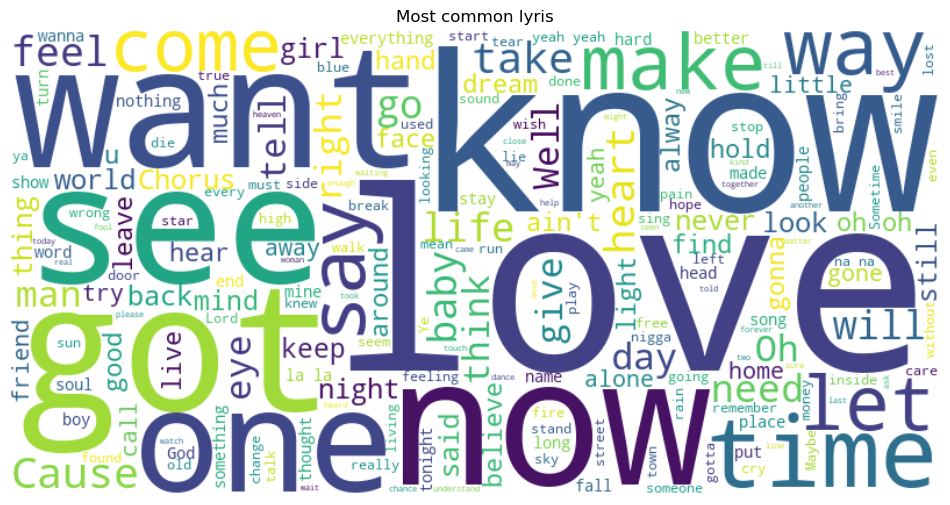

In [12]:
plt.figure(figsize=(12,12))
plt.imshow(word_cloud,interpolation = 'bilinear')
plt.axis('off')
plt.title("Most common lyris")
plt.show()

In [13]:
#nltk.download('punkt')
#nltk.download('punkt_tab')
#nltk.download('stopwords')

In [14]:
# getting the stop_words 
stop_words = set(stopwords.words("english"))


In [15]:
def preprocess_text(text):
    #removing special characters and numbers
    text = re.sub(r"[^a-zA-Z\s]"," ",text)
    # converting text to lower case
    text = text.lower()
    # tokenizing each text
    tokens = word_tokenize(text)
    #removing the stopwords from tokens
    tokens = [word for word in tokens if word not in stop_words]
    return " ".join(tokens)

In [16]:
df['cleaned_text'] = df['text'].apply(preprocess_text)

In [17]:
df

,artist,song,text,cleaned_text
56253,Whitney Houston,Higher Love,[VERSE 1] \r\nThink about it \r\nThere must ...,verse think must higher love heart hidden star...
55836,Weezer,El Scorcho,Goddamn you half-Japanese girls \r\nDo it to ...,goddamn half japanese girls every time oh redh...
34561,Grateful Dead,Searchin',"(With The Beach Boys) \r\nWell, I've been sea...",beach boys well searchin searchin searchin eve...
39442,Kate Bush,The Magician,When you reach for a star \r\nOnly angels are...,reach star angels far step stair take look clo...
49166,Procol Harum,Piggy Pig Pig,"Wash yourself and see your sorrow, make every ...",wash see sorrow make every pitcher clean take ...
...,...,...,...,...
13722,Neil Diamond,If I Ruled The World,If I ruled the world \r\nEvery day would be ...,ruled world every day would first day spring e...
26750,Carly Simon,Blackbird,Blackbird singing in the dead of night \r\nTa...,blackbird singing dead night take broken wings...
35171,Hank Williams,Lonely Tombs,"(e) I was strollin' one day, in a lonely grave...",e strollin one day lonely graveyard voice tomb...
2201,Carly Simon,Pure Sin,I can barely see your sneakers \r\nYou say I ...,barely see sneakers say got keep head painting...


In [18]:
# converting the text data into feature vector
vectorizer = TfidfVectorizer()
feature_vector = vectorizer.fit_transform(df['cleaned_text'])
similarity = cosine_similarity(feature_vector,feature_vector)
print(similarity)

[[1.         0.11049409 0.0265163  ... 0.03656372 0.09575902 0.01448071]
 [0.11049409 1.         0.04122283 ... 0.03817326 0.0502912  0.0116167 ]
 [0.0265163  0.04122283 1.         ... 0.01217386 0.04427088 0.00880173]
 ...
 [0.03656372 0.03817326 0.01217386 ... 1.         0.01729804 0.00254001]
 [0.09575902 0.0502912  0.04427088 ... 0.01729804 1.         0.01420181]
 [0.01448071 0.0116167  0.00880173 ... 0.00254001 0.01420181 1.        ]]


In [19]:
# Based on the similarity score ythe model recommend the song for the user

In [20]:
def recommend_song(song_name, similarity = similarity, df = df , top_n = 10):
    idx = df[df["song"].str.lower() == song_name.lower()].index

    if len(idx) == 0:
        print("song not found in dataset")
    idx = idx[0]
    similarity_score = list(enumerate(similarity[idx]))
    sorted_similarity_score = sorted(similarity_score , key = lambda x : x[1],reverse  = True)
    
    sorted_similarity_score = sorted_similarity_score[ :top_n]
    ind = [song[0] for song in sorted_similarity_score]
    title_from_index = df.iloc[ind][['artist','song']]
    print(f" - {title_from_index}")
   
    

In [22]:
# Recoomending the top 10 song based the similarity score
song = input("%%%%%% ^^^^^^ Enter your favourate movie:  ")
recommend_song(song)


%%%%%% ^^^^^^ Enter your favourate movie:   Pure Sin


 -                    artist                              song
27645           Chris Rea                      Stick By You
27646           Chris Rea                          Stick It
14685  Ocean Colour Scene  The Inheritors - So Low B - Side
51232                Rush                      Stick It Out
519       Alice In Chains                         God Smack
34168       Glen Campbell              This Is Sarah's Song
550         Alison Krauss                 It Doesn't Matter
36366          Ian Hunter                       Gun Control
32668        Foo Fighters                  A Matter of Time
10856                Kiss                       Let Me Know
